In [12]:
import os
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import pandas as pd

# Loading audio files with Librosa

In [7]:
scale_file = "audio/scale.wav"
debussy_file = "audio/debussy.wav"
redhot_file = "audio/redhot.wav"
duke_file = "audio/duke.wav"

In [8]:
ipd.Audio(scale_file)

In [6]:
ipd.Audio(debussy_file)

In [5]:
ipd.Audio(redhot_file)

In [4]:
ipd.Audio(duke_file)

In [9]:
# Load audio files with librosa
scale, sr = librosa.load(scale_file)
debussy, _ = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _ = librosa.load(duke_file)

In [15]:
sr

22050

In [20]:
[len(x) for x in (scale, debussy, redhot, duke)]

[174943, 661500, 661500, 661500]

# Plot the Signals

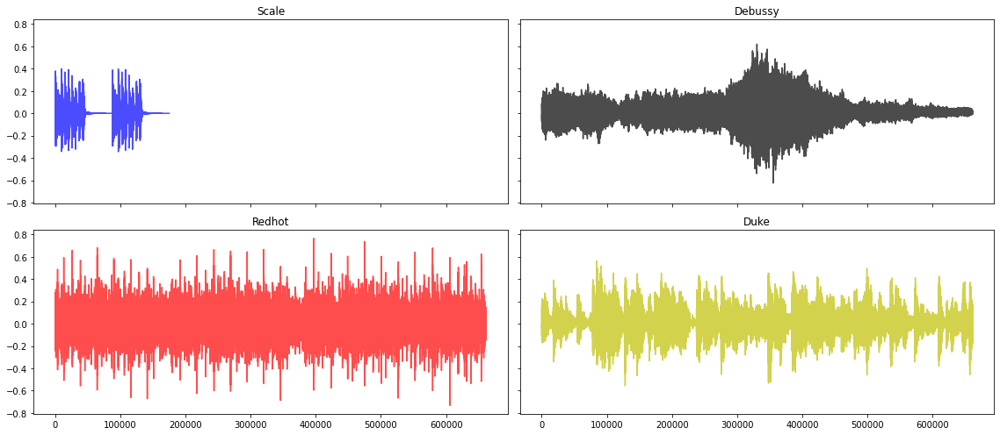

In [40]:
f, axes = plt.subplots(2,2, figsize=(16,7), sharex=True, sharey=True)
xs = axes.flatten()
pd.Series(scale).plot(title="Scale", ax= xs[0], color="b", alpha=0.7)
pd.Series(debussy).plot(title="Debussy", ax= xs[1], color="k", alpha=0.7)
pd.Series(redhot).plot(title="Redhot", ax= xs[2], color="r", alpha=0.7)
pd.Series(duke).plot(title="Duke", ax= xs[3], color="y", alpha=0.7)
plt.tight_layout()

In [ ]:
# extract amplitude envelope
# extract root mean square energy
# extract zero crossing rate
# extract DFT coeficients

# Extract Short Term Fourier Transform Coeficients (STFC)

In [41]:
# set parameters
FRAME_SIZE = 2048
HOP_SIZE = 512

In [44]:
scale.shape

(174943,)

In [42]:
S_scale = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [43]:
S_scale.shape

(1025, 342)

In [46]:
# confirm shape
# rows = number of frequency bins (k) # frequency bins
# columns = number of time frames (m) # time frames

rows = FRAME_SIZE/2 + 1; print(rows)
cols = (len(scale)- FRAME_SIZE)/HOP_SIZE + 1; print(cols)

1025.0
338.685546875


In [51]:
# not sure why cols don't match, close but not exact!

In [54]:
type(S_scale[0][0])

numpy.complex64

# Calculating the Spectogram

In [58]:
Y_scale = np.square(np.abs(S_scale))

In [59]:
Y_scale.shape

(1025, 342)

In [60]:
type(Y_scale[0][0])

numpy.float32

In [62]:
#pd.DataFrame(Y_scale).plot(kind="")

# Visualizing Spectogram

In [63]:
def plot_spectogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                            sr = sr, 
                             hop_length=hop_length,
                             x_axis = "time", 
                             y_axis=y_axis
                            )
    plt.colorbar(format="%+2.f")

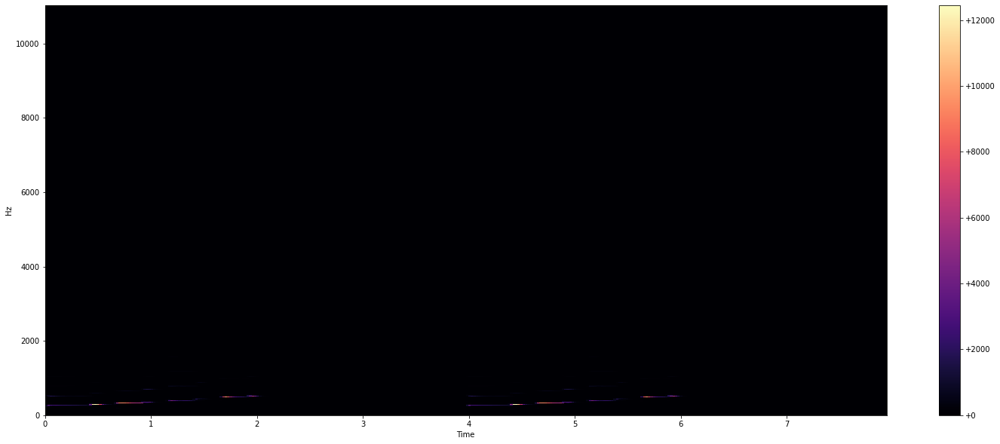

In [66]:
plot_spectogram(Y_scale, sr, HOP_SIZE)

# Log-Amplitude Spectogram

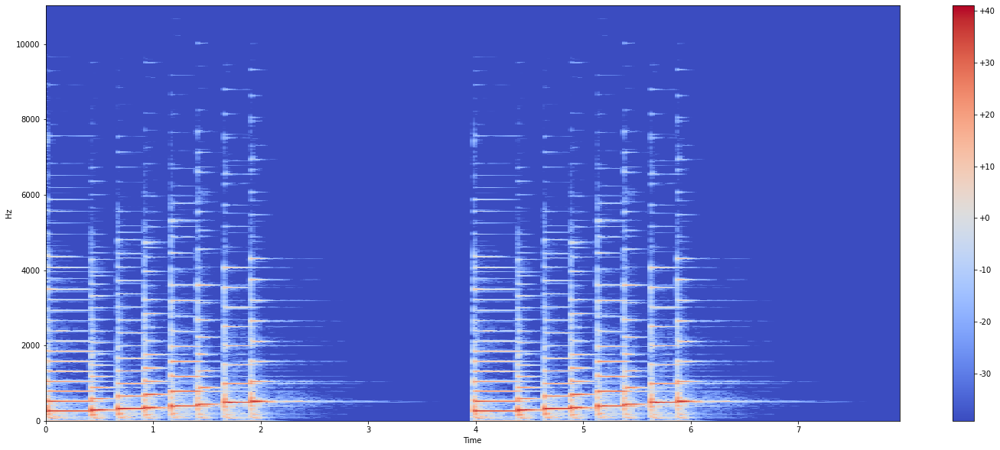

In [68]:
# decibels, are a log transformation, closer to how we perceive sound in the real world
Y_log_scale = librosa.power_to_db(Y_scale)
plot_spectogram(Y_log_scale, sr, HOP_SIZE)

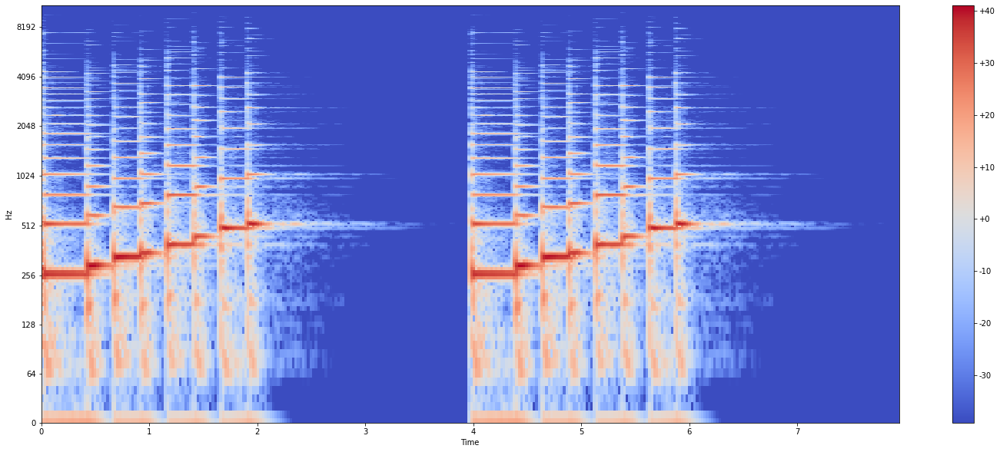

In [69]:
# we also perceive frequency logarithmic not linear
# so apply log transformation on the frequency as well as the amplitude?
# creates a log frequency, log spectogram
plot_spectogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")

# Visualizing the other genres

In [ ]:
# Steps
# get spectrum from STFF
# get real number representation of spectrum
# transform to log using power to db (decibel)
# plot on log axes

In [73]:
def visualize_spectrum_full(signal, sr, frame_size, hop_length):
    # get spectrum from stft
    S_matrix = librosa.spectrum.stft(y=signal, n_fft=frame_size, hop_length=hop_length)
    print(S_matrix.shape)
    # get real valued representation of spec
    Y_matrix = np.square(np.abs(S_matrix))
    print(Y_matrix.shape)
    # tranform to log
    Y_matrix_log = librosa.power_to_db(Y_matrix)
    print(Y_matrix_log.shape)
    # plot on log frequency, amplitude axes
    plot_spectogram(Y_matrix_log, sr, hop_length=hop_length, y_axis='log')
    
    return #Y_matrix_log

(1025, 342)
(1025, 342)
(1025, 342)


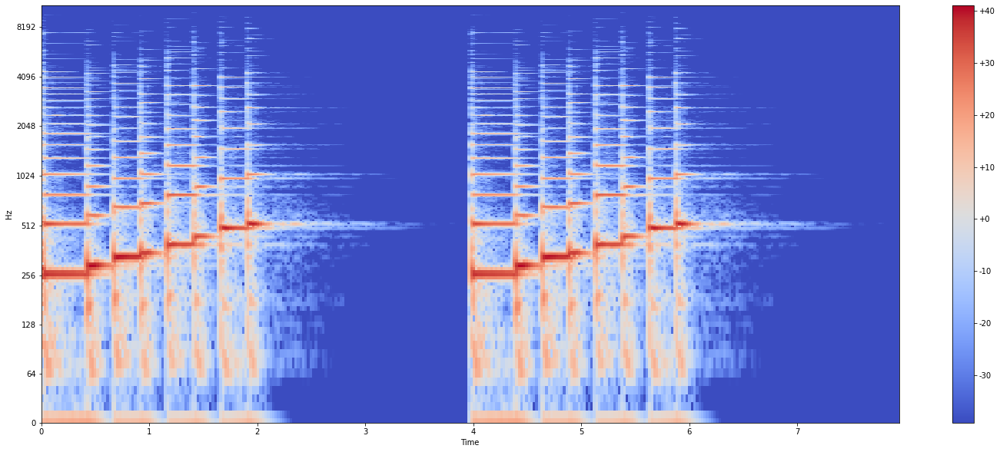

In [74]:
visualize_spectrum_full(signal=scale, sr=sr, frame_size=FRAME_SIZE, hop_length=HOP_SIZE)

(1025, 1292)
(1025, 1292)
(1025, 1292)


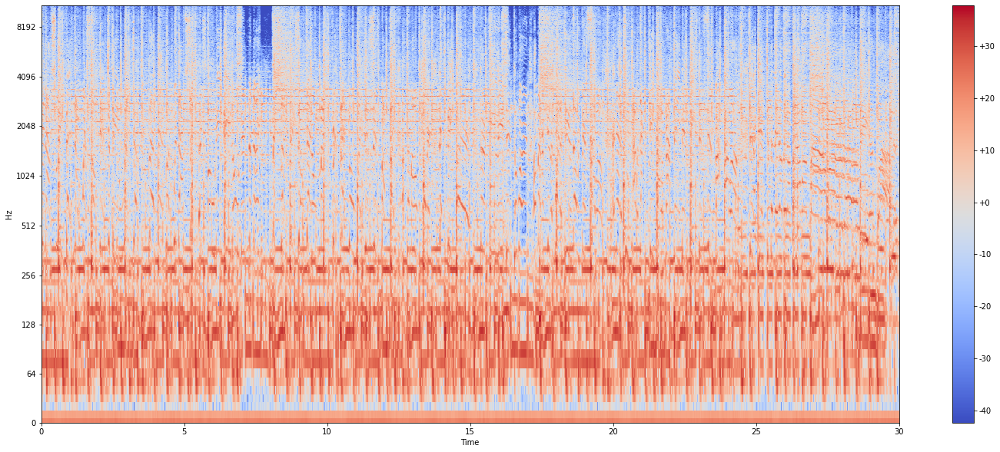

In [75]:
visualize_spectrum_full(signal=redhot, sr=sr, frame_size=FRAME_SIZE, hop_length=HOP_SIZE)

(1025, 1292)
(1025, 1292)
(1025, 1292)


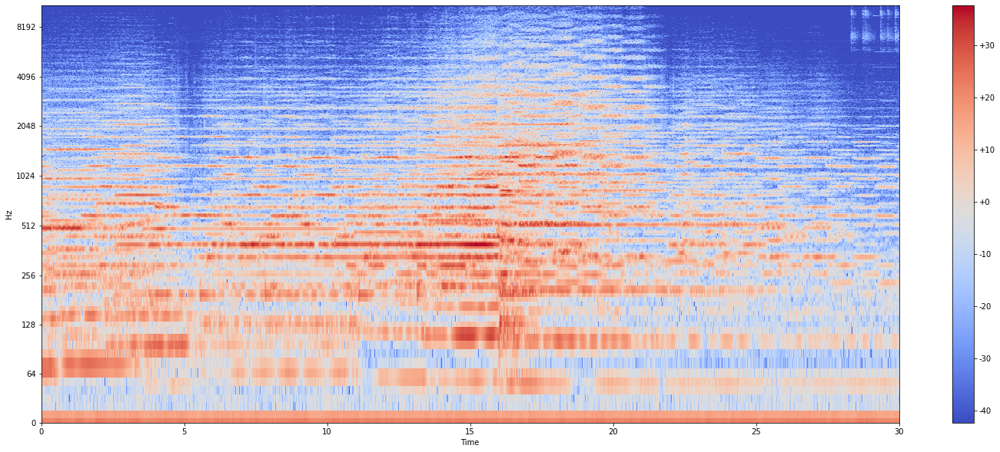

In [76]:
visualize_spectrum_full(signal=debussy, sr=sr, frame_size=FRAME_SIZE, hop_length=HOP_SIZE)

(1025, 1292)
(1025, 1292)
(1025, 1292)


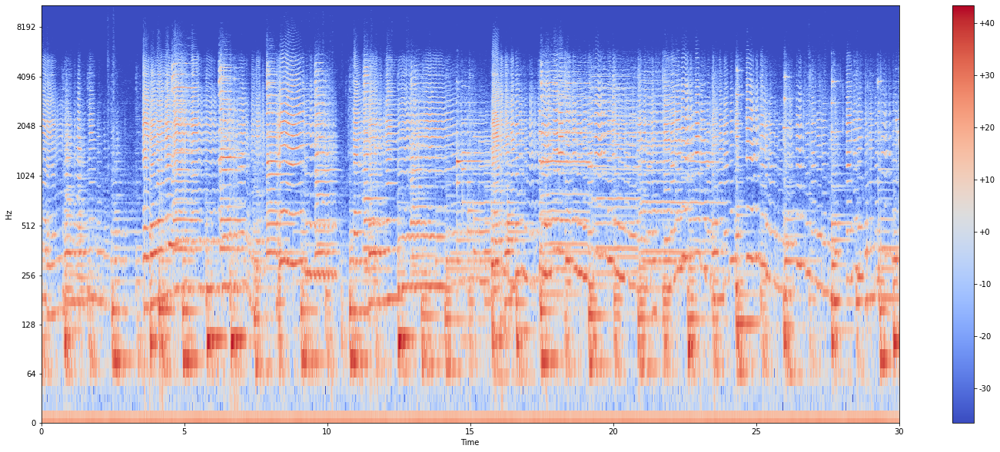

In [77]:
visualize_spectrum_full(signal=duke, sr=sr, frame_size=FRAME_SIZE, hop_length=HOP_SIZE)